In [1]:
from sarfusion.data.wisard import WiSARDDataset
from torchvision import transforms
from einops import rearrange
import numpy as np
import torch
import cv2
import lovely_tensors as lt
import torch.nn.functional as F
import torchvision.transforms.functional as tvF
lt.monkey_patch()

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
def draw_bbox_yolo(image, bboxes, color=(0, 255, 0), thickness=2):
    """
    Draw bounding boxes on an image given bounding box coordinates in YOLO format.
    
    Args:
    - image: numpy array representing the image
    - bboxes: list of bounding box coordinates in YOLO format (center_x, center_y, width, height)
    - color: color of the bounding box (BGR format)
    - thickness: thickness of the bounding box lines
    
    Returns:
    - image with bounding boxes drawn
    """
    image = rearrange(image, 'c h w  -> h w c')
    color = torch.tensor(color, device=image.device).float() / 255
    
    height, width = image.shape[:2]
    for bbox in bboxes:
        cls, center_x, center_y, w, h = bbox
        left = int(center_x * width - w * width / 2)
        top = int(center_y * height - h * height / 2)
        right = int(center_x * width + w * width / 2)
        bottom = int(center_y * height + h * height / 2)
        
        # Drawing bounding box
        image[top:bottom, left:left+thickness] = color
        image[top:bottom, right-thickness:right] = color
        image[top:top+thickness, left:right] = color
        image[bottom-thickness:bottom, left:right] = color
        
    image = rearrange(image, 'h w c -> c h w')
    
    return image

In [129]:
VIS = [
    "200321_Baker_Phantom_VIS",
    "200402_Carnation_Inspire_VIS",
    "200402_Karen_Inspire_VIS",
    "200426_SkookumCreek_Mavic_Mini_VIS_0006",
    "200426_SkookumCreek_Mavic_Mini_VIS_0007",
    "200426_SkookumCreek_Mavic_Mini_VIS_0008",
    "200505_Bellingham_Mavic_Mini_VIS_0015",
    "200505_Bellingham_Mavic_Mini_VIS_0016",
    "200528_Everson_Mavic_Mini_VIS_0021",
    "200528_Everson_Mavic_Mini_VIS_0028",
    "200528_Everson_Mavic_Mini_VIS_0029",
    "200528_Everson_Mavic_Mini_VIS_0031",
    "200614_SuddenValley_Phantom_VIS_0005",
    "200614_SuddenValley_Phantom_VIS_0006",
    "200614_SuddenValley_Phantom_VIS_0012",
    "200614_SuddenValley_Phantom_VIS_0013",
    "200614_SuddenValley_Phantom_VIS_0014",
    "200717_Mission_FLIR_VIS",
    "210327_Airfield_FLIR_VIS_1",
    "210327_Airfield_FLIR_VIS_2",
    "210327_Airfield_FLIR_VIS_3",
    "210327_Airfield_FLIR_VIS_4",
]

IR = [
    "200704_Baker_FLIR_IR_1",
    "200704_Baker_FLIR_IR_2",
    "200910_Carnation_FLIR_IR_1",
    "200910_Carnation_FLIR_IR_2",
    "200910_Carnation_FLIR_IR_3",
    "200910_Carnation_FLIR_IR_4",
    "200910_Carnation_FLIR_IR_5",
    "200910_Carnation_FLIR_IR_6",
    "200910_Carnation_FLIR_IR_7",
    "200929_Karen_FLIR_IR_1",
    "200929_Karen_FLIR_IR_2",
    "200929_Karen_FLIR_IR_3",
    "200929_Karen_FLIR_IR_4",
    "200929_Karen_FLIR_IR_5",
    "200929_Karen_FLIR_IR_6",
    "220109_Baker_Enterprise_IR_2",
    "210327_Airfield_FLIR_IR_1",
    "210327_Airfield_FLIR_IR_2",
    "210327_Airfield_FLIR_IR_3",
    "210327_Airfield_FLIR_IR_4",
    "210327_Airfield_FLIR_IR_5",
    "210327_Airfield_FLIR_IR_6",
    "210327_Airfield_FLIR_IR_7",
    "210327_Airfield_FLIR_IR_8",
]

VIS_IR = [
    ("210417_MtErie_Enterprise_VIS_0003", "210417_MtErie_Enterprise_IR_0004"),
    ("210417_MtErie_Enterprise_VIS_0005", "210417_MtErie_Enterprise_IR_0006"),
    ("210417_MtErie_Enterprise_VIS_0007", "210417_MtErie_Enterprise_IR_0008"),
    ("210529_Carnation_Enterprise_VIS_0023", "210529_Carnation_Enterprise_IR_0024"),
    ("210529_Carnation_Enterprise_VIS_0025", "210529_Carnation_Enterprise_IR_0026"),
    ("210812_Hannegan_Enterprise_VIS_0053", "210812_Hannegan_Enterprise_IR_0054"),
    ("210812_Hannegan_Enterprise_VIS_0055", "210812_Hannegan_Enterprise_IR_0056"),
    ("210924_FHL_Enterprise_VIS_0126", "210924_FHL_Enterprise_IR_0127"),
    ("210924_FHL_Enterprise_VIS_0134", "210924_FHL_Enterprise_IR_0135"),
    ("210924_FHL_Enterprise_VIS_0401", "210924_FHL_Enterprise_IR_0402"),
    ("210924_FHL_Enterprise_VIS_0403", "210924_FHL_Enterprise_IR_0404"),
    ("210924_FHL_Enterprise_VIS_0405", "210924_FHL_Enterprise_IR_0406"),
    ("210924_FHL_Enterprise_VIS_0407", "210924_FHL_Enterprise_IR_0408"),
    ("210924_FHL_Enterprise_VIS_0409", "210924_FHL_Enterprise_IR_0410"),
    ("210924_FHL_Enterprise_VIS_0564", "210924_FHL_Enterprise_IR_0565"),
    ("210924_FHL_Enterprise_VIS_0566", "210924_FHL_Enterprise_IR_0567"),
    ("220109_Baker_Enterprise_VIS_1", "220109_Baker_Enterprise_IR_1"),
]


TRAIN_IR = [9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23]
VAL_IR = [2, 3, 4, 5, 6, 7, 8]
TEST_IR = [0, 1, 15]


In [130]:
folders = [IR[i] for i in TRAIN_IR]

In [131]:

vis_transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

ir_transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


wisard = WiSARDDataset(
    root="dataset/WiSARD",
    folders=folders,
    transform=vis_transform,
    ir_transform=ir_transform,
)

In [132]:
len(wisard)

9585

In [133]:
len(wisard) / 12434

0.770870194627634

In [7]:
len(wisard)

5739

In [35]:
data_dict = wisard[500]

In [36]:
data_dict.target

[[3, 0.509896, 0.681481, 0.023698, 0.056019],
 [1, 0.476042, 0.658333, 0.024479, 0.058796]]

In [37]:
img = data_dict.images.clone()
rgb = img[:3]

# Draw bounding boxes on the image
rgb = draw_bbox_yolo(rgb, data_dict.target, color=(0, 255, 0), thickness=2)

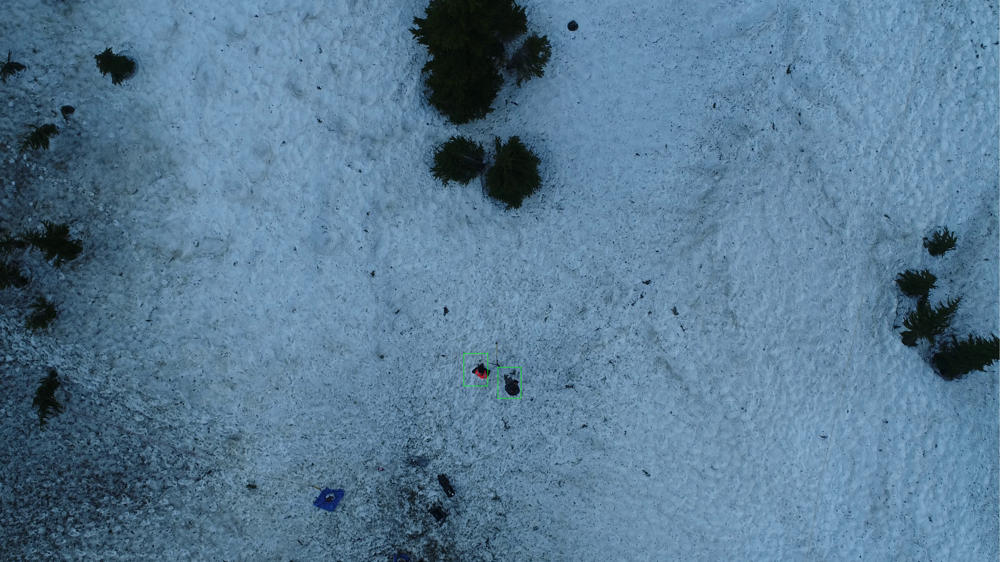

In [38]:
rgb.rgb